In [25]:
import warnings
warnings.filterwarnings("ignore", message=".*Graph is not fully connected.*")

/usr/bin/pip:6: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import load_entry_point
{'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'i

/home/hduser_/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


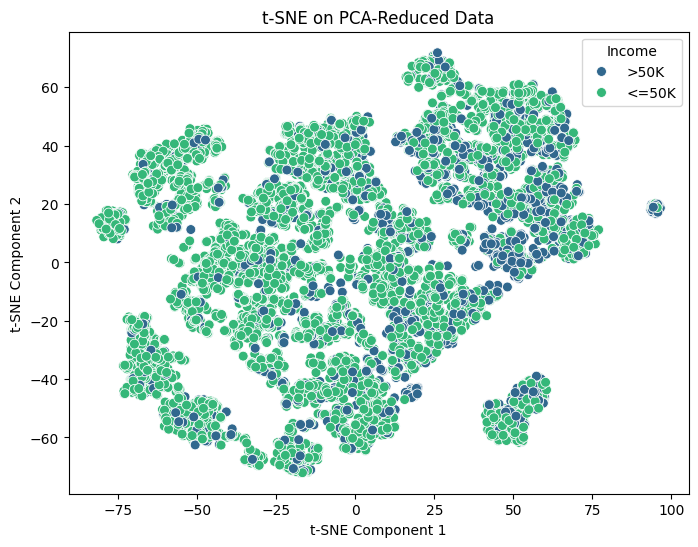

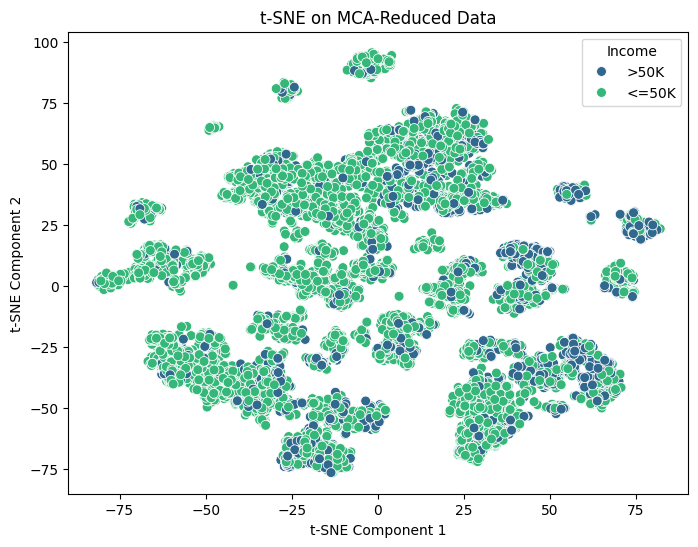

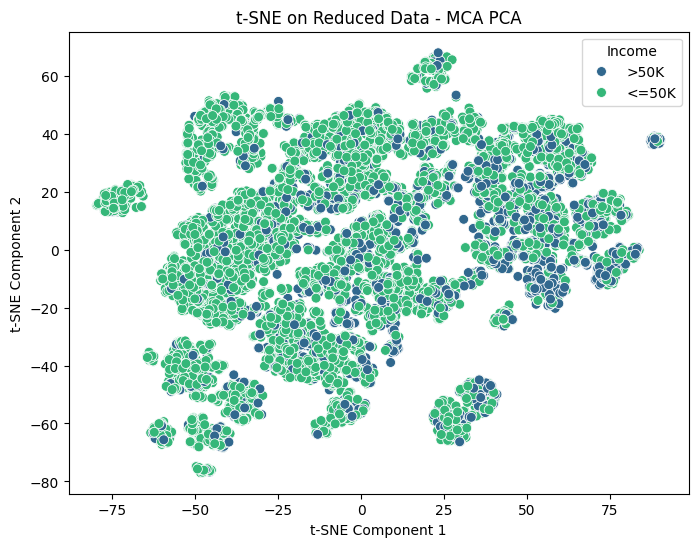

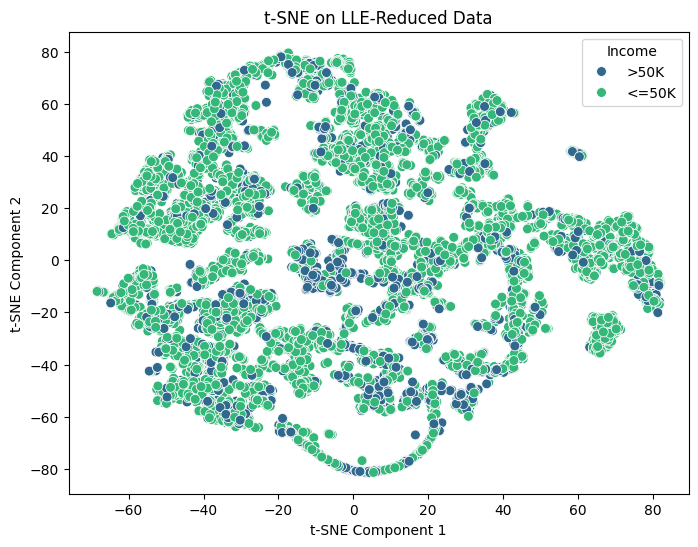

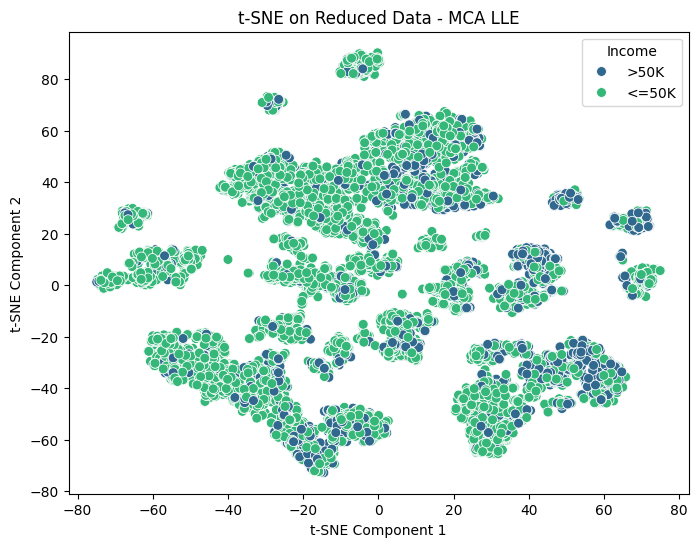

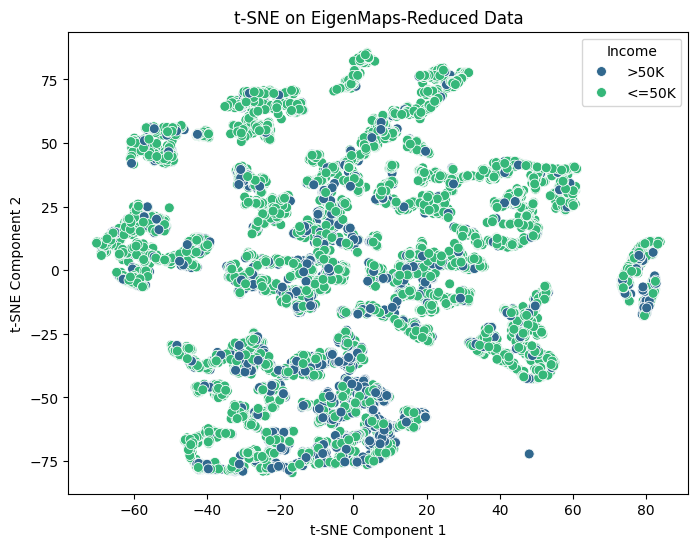

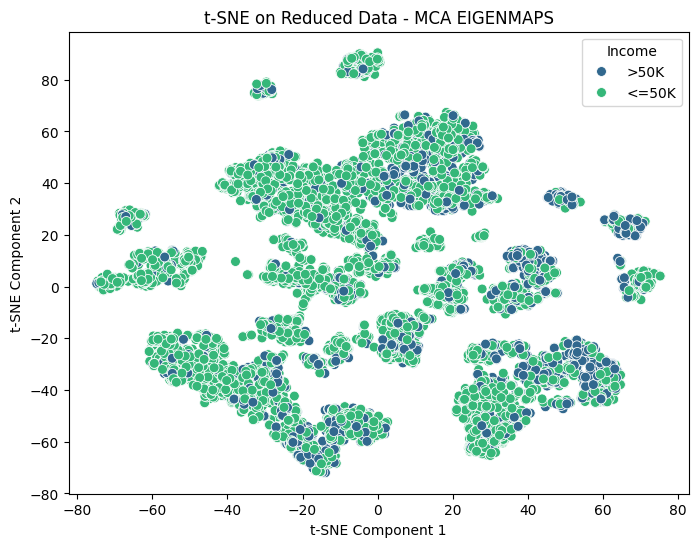

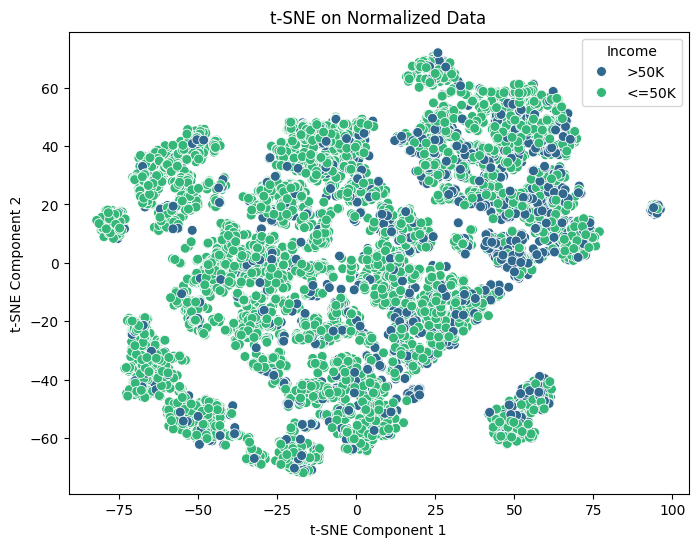

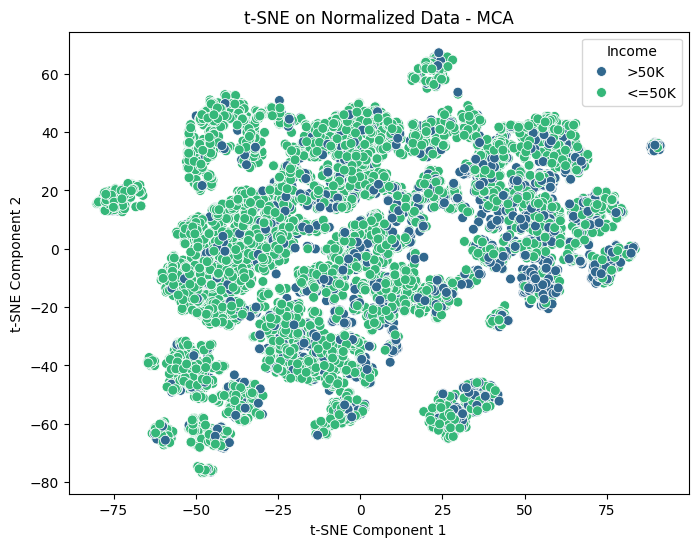

In [1]:
%run -i TSNE.ipynb

# Algorithms

## KMeans

In [10]:
def find_kmeans(X_combined):
    best_kmeans = None
    best_silhouette = -1
    best_i = -1
    kmeans_results = {}
    
    for i in range(2, 30):
        kmeans = KMeans(n_clusters=i, n_init=27, random_state=38)
        kmeans_labels = kmeans.fit_predict(X_combined)
        score = silhouette_score(X_combined, kmeans_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_kmeans = kmeans_labels
            best_i = i
        kmeans_results[i] = {}
        kmeans_results[i]["labels"] = kmeans_labels
        kmeans_results[i]["loss"] = kmeans.inertia_
        kmeans_results[i]["score"] = score
    return kmeans_results, best_i, best_silhouette, best_kmeans

## GMM

In [11]:
from sklearn.mixture import GaussianMixture

def find_gmm(X_combined):
    best_gmm = None
    best_silhouette = -1
    best_i = -1
    gmm_results = {}

    for i in range(2, 30):
        gmm = GaussianMixture(n_components=i, random_state=68)
        gmm_labels = gmm.fit_predict(X_combined)
        score = silhouette_score(X_combined, gmm_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_gmm = gmm_labels
            best_i = i
        gmm_results[i] = {}
        gmm_results[i]["labels"] = gmm_labels
        gmm_results[i]["score"] = score
    return gmm_results, best_i, best_silhouette, best_gmm
        

## DBSCAN

In [12]:
from sklearn.cluster import DBSCAN

def find_dbscan(X_combined):
    dbscan = DBSCAN(eps=0.3, min_samples=5)
    dbscan_labels = dbscan.fit_predict(X_combined)
    dbscan_silhouette = silhouette_score(X_combined, dbscan_labels)
    return dbscan_labels, dbscan_silhouette


## HDBSCAN

In [13]:
import hdbscan

def find_hdbscan(X_combined):
    hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=5)
    hdbscan_labels = hdbscan_model.fit_predict(X_combined)
    hdbscan_silhouette = silhouette_score(X_combined, hdbscan_labels)
    return hdbscan_labels, hdbscan_silhouette
    

## Spectral Clustering

In [20]:
from sklearn.cluster import SpectralClustering

def find_spec(X_combined):
    best_spec = None
    best_silhouette = -1
    best_i = -1
    spec_results = {}

    for i in range(2, 30):
        spec = SpectralClustering(n_clusters=i, affinity='nearest_neighbors', random_state=15)
        spectral_labels = spec.fit_predict(X_combined)
        score = silhouette_score(X_combined, spectral_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_spec = spectral_labels
            best_i = i
        spec_results[i] = {}
        spec_results[i]["labels"] = spectral_labels
        spec_results[i]["score"] = score
    return spec_results, best_i, best_silhouette, best_spec


## Fuzzy-CMeans

In [15]:
import skfuzzy as fuzz

def find_fuzzy(X_combined):
    best_fuzzy = None
    best_silhouette = -1
    best_i = -1
    fuzzy_results = {}

    for i in range(2, 30):
        cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
        X_combined.T, c=i, m=2, error=0.005, maxiter=1000, init=None
        )
        fuzzy_labels = u.argmax(axis=0)
        score = silhouette_score(X_combined, fuzzy_labels)
        if score > best_silhouette:
            best_silhouette = score
            best_fuzzy = fuzzy_labels
            best_i = i
        fuzzy_results[i] = {}
        fuzzy_results[i]["labels"] = fuzzy_labels
        fuzzy_results[i]["score"] = score
    return fuzzy_results, best_i, best_silhouette, best_fuzzy


## Plot

In [16]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

def plot_results_on_tsne(X_tsne, best_kmeans, best_gmm, dbscan_labels, hdbscan_labels, best_spec, best_fuzzy):
    # Create a DataFrame for visualization
    tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
    tsne_df['KMeans Cluster'] = best_kmeans
    tsne_df['GMM Cluster'] = best_gmm
    tsne_df['DBSCAN Cluster'] = dbscan_labels
    tsne_df['HDBSCAN Cluster'] = hdbscan_labels
    tsne_df['Spectral Cluster'] = best_spec
    tsne_df['Fuzzy-CMeans Cluster'] = best_fuzzy

    # Plot K-Means clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='KMeans Cluster', palette='Set1', alpha=0.7)
    plt.title('K-Means Clustering on Combined PCA and MCA Components')
    plt.show()

    # Plot GMM clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='GMM Cluster', palette='Set2', alpha=0.7)
    plt.title('GMM Clustering on Combined PCA and MCA Components')
    plt.show()

    # Plot DBSCAN clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='DBSCAN Cluster', palette='Set3', alpha=0.7)
    plt.title('DBSCAN Clustering on Combined PCA and MCA Components')
    plt.show()

    # Plot HDBSCAN clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='HDBSCAN Cluster', palette='Set3', alpha=0.7)
    plt.title('HDBSCAN Clustering on Combined PCA and MCA Components')
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Spectral Cluster', palette='Set2', alpha=0.7)
    plt.title("Spectral Clustering on Combined PCA and MCA Components")
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Fuzzy-CMeans Cluster', palette='Set2', alpha=0.7)
    plt.title("Fuzzy Clustering on Combined PCA and MCA Components")
    plt.show()


# PCA Data

In [21]:
kmeans_results_pca, best_i, best_silhouette, best_kmeans = find_kmeans(X_combined_pca)
print(f"{best_i} has the best K-Means Silhouette Score: {best_silhouette:.2f}")

gmm_results_pca, best_i, best_silhouette, best_gmm = find_gmm(X_combined_pca)
print(f"{best_i} has the best GMM Silhouette Score: {best_silhouette:.2f}")

dbscan_labels_pca, dbscan_silhouette_pca = find_dbscan(X_combined_pca)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette_pca:.2f}")

hdbscan_labels_pca, hdbscan_silhouette_pca = find_hdbscan(X_combined_pca)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette_pca:.2f}")

spec_results_pca, best_i, best_silhouette, best_spec = find_spec(X_combined_pca)
print(f"{best_i} has the best Spectral Silhouette Score: {best_silhouette:.2f}")

fuzzy_results_pca, best_i, best_silhouette, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {best_silhouette:.2f}")

3 has the best K-Means Silhouette Score: 0.52
2 has the best GMM Silhouette Score: 0.27
DBSCAN Silhouette Score: -0.50
HDBSCAN Silhouette Score: 0.77


/home/hduser_/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/hduser_/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/hduser_/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/hduser_/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/hduser_/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home

2 has the best Spectral Silhouette Score: 0.77
3 has the best CMeans Score: 0.16


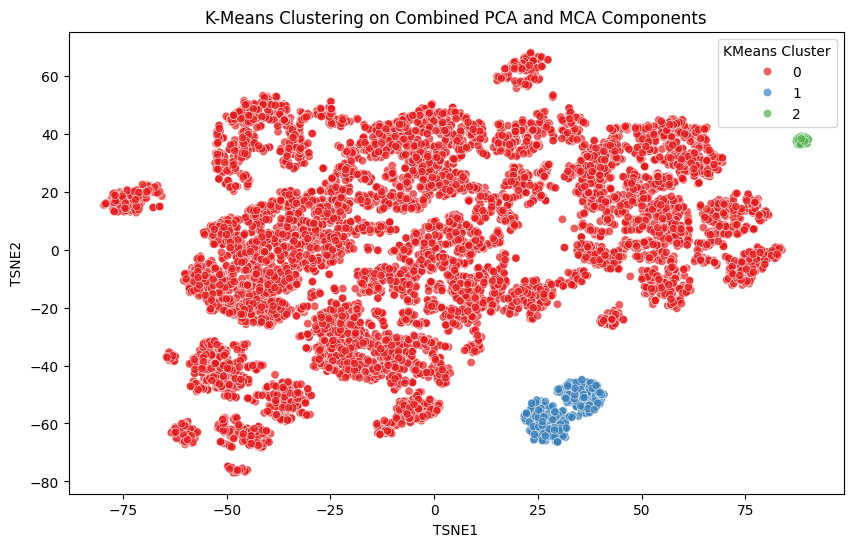

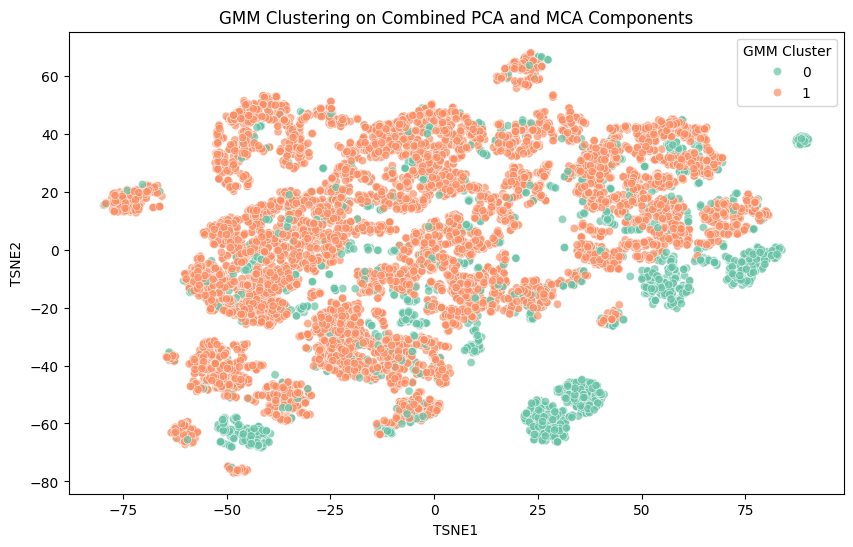

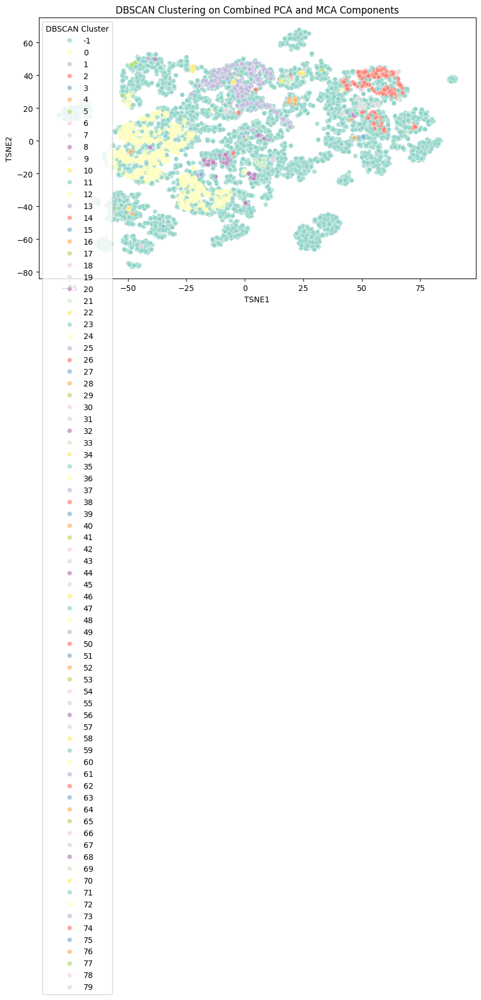

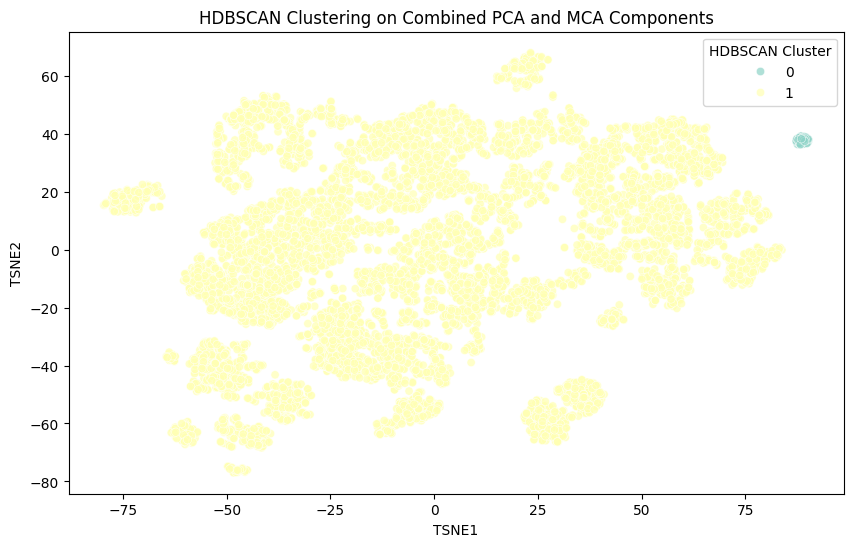

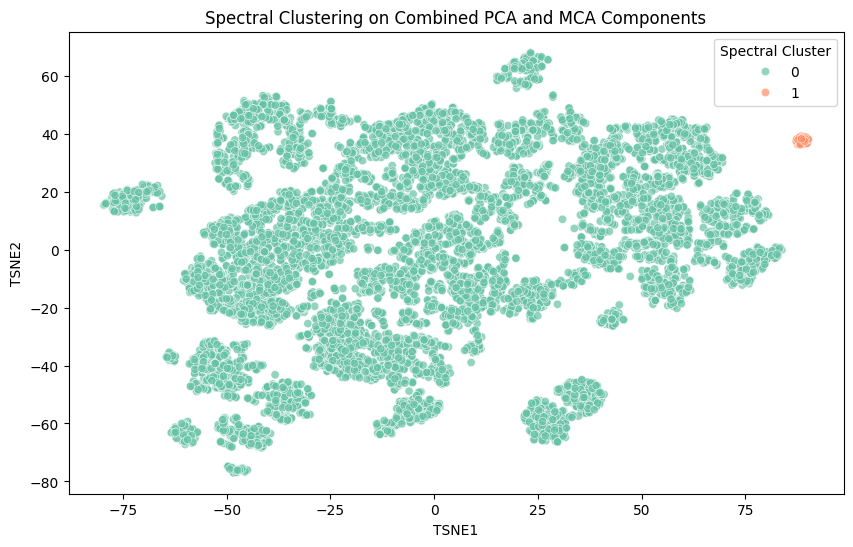

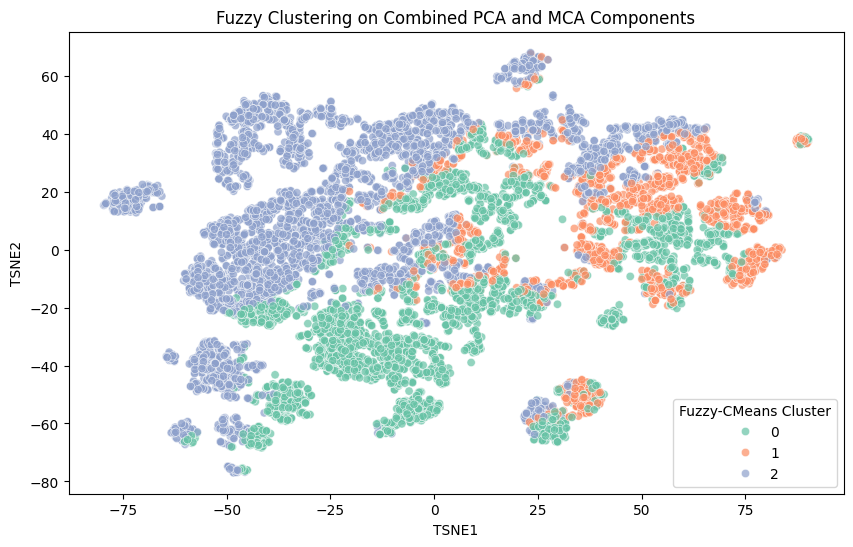

In [22]:
plot_results_on_tsne(X_tsne_pca, best_kmeans, best_gmm, dbscan_labels_pca, hdbscan_labels_pca, best_spec, best_fuzzy)

# LLE Data

In [26]:
kmeans_results_lle, best_i, best_silhouette, best_kmeans = find_kmeans(X_combined_lle)
print(f"{best_i} has the best K-Means Silhouette Score: {best_silhouette:.2f}")

gmm_results_lle, best_i, best_silhouette, best_gmm = find_gmm(X_combined_lle)
print(f"{best_i} has the best GMM Silhouette Score: {best_silhouette:.2f}")

dbscan_labels_lle, dbscan_silhouette_lle = find_dbscan(X_combined_lle)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette_lle:.2f}")

hdbscan_labels_lle, hdbscan_silhouette_lle = find_hdbscan(X_combined_lle)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette_lle:.2f}")

spec_results_lle, best_i, best_silhouette, best_spec = find_spec(X_combined_lle)
print(f"{best_i} has the best Spectral Silhouette Score: {best_silhouette:.2f}")

fuzzy_results_lle, best_i, best_silhouette, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {best_silhouette:.2f}")

10 has the best K-Means Silhouette Score: 0.32
2 has the best GMM Silhouette Score: 0.24
DBSCAN Silhouette Score: 0.24
HDBSCAN Silhouette Score: 0.00
3 has the best Spectral Silhouette Score: 0.39
3 has the best CMeans Score: 0.16


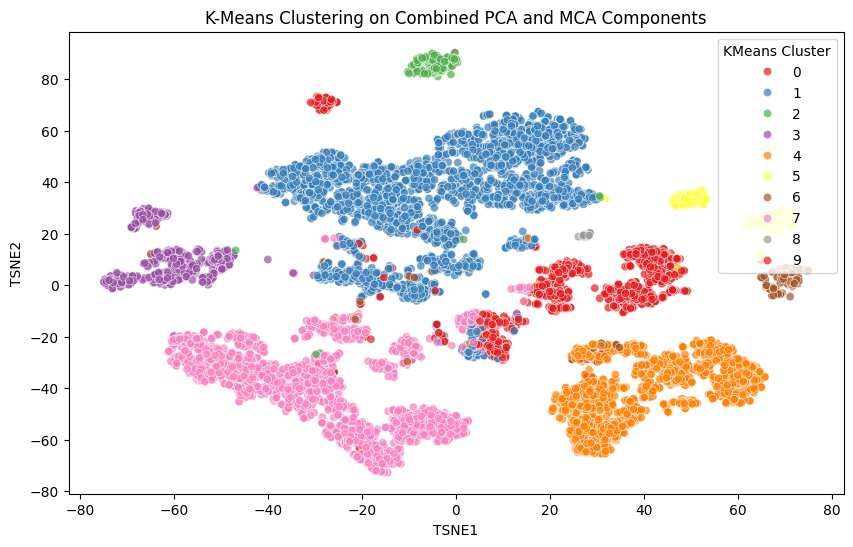

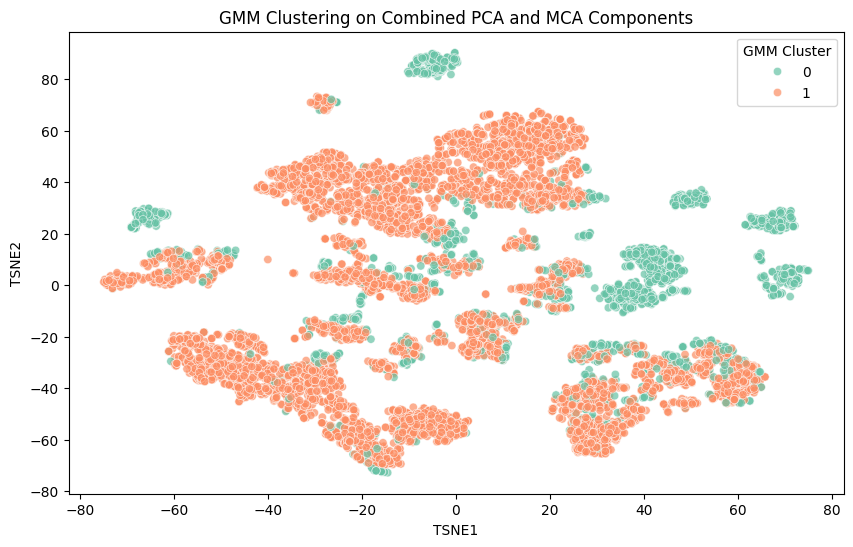

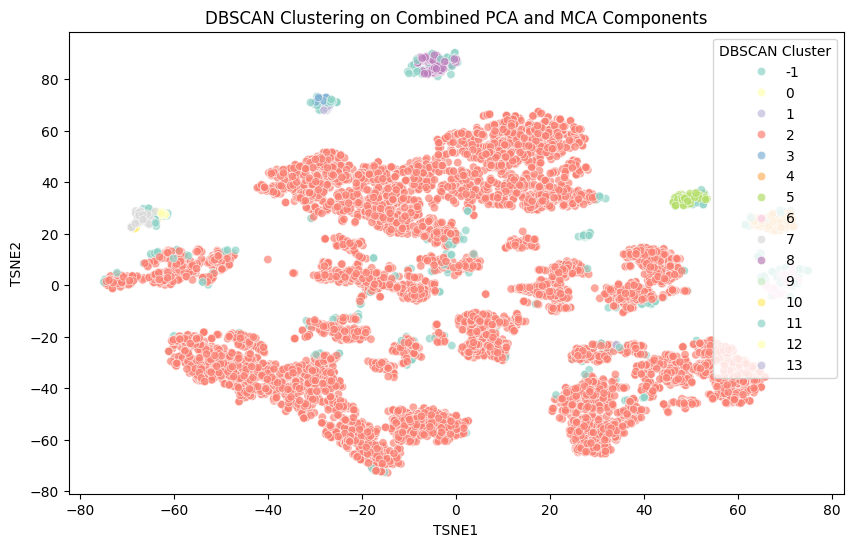

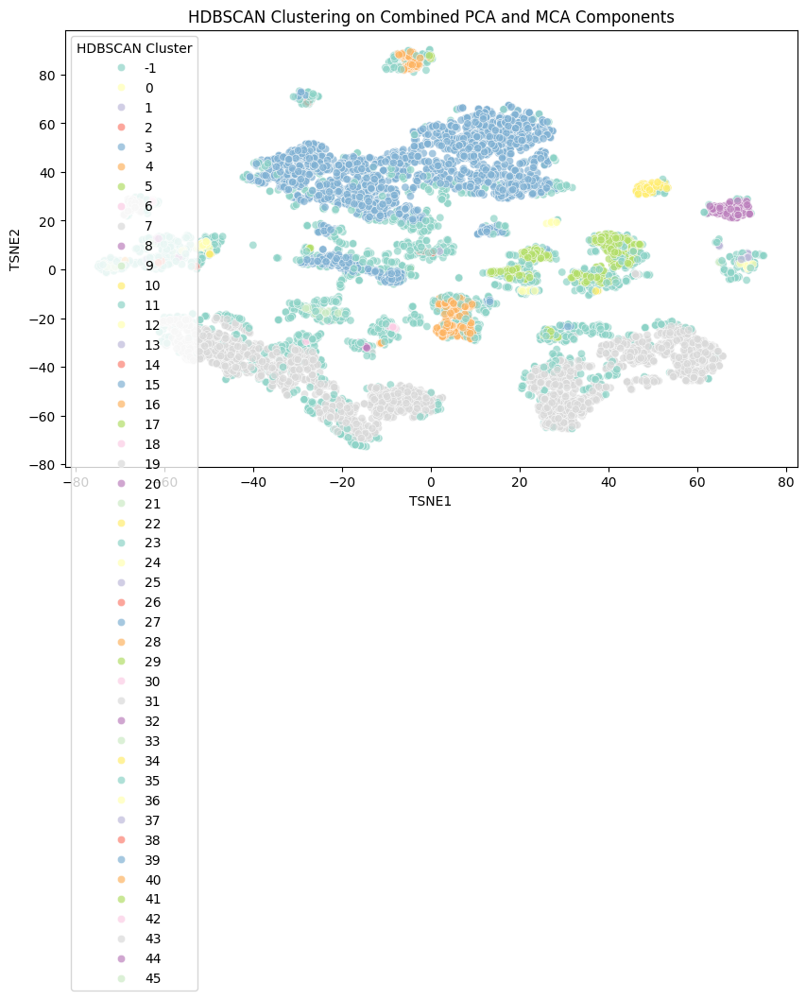

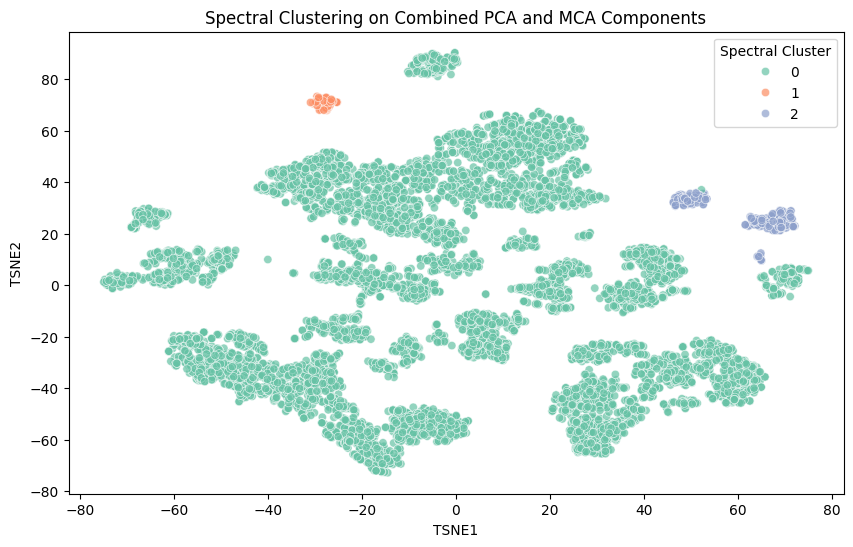

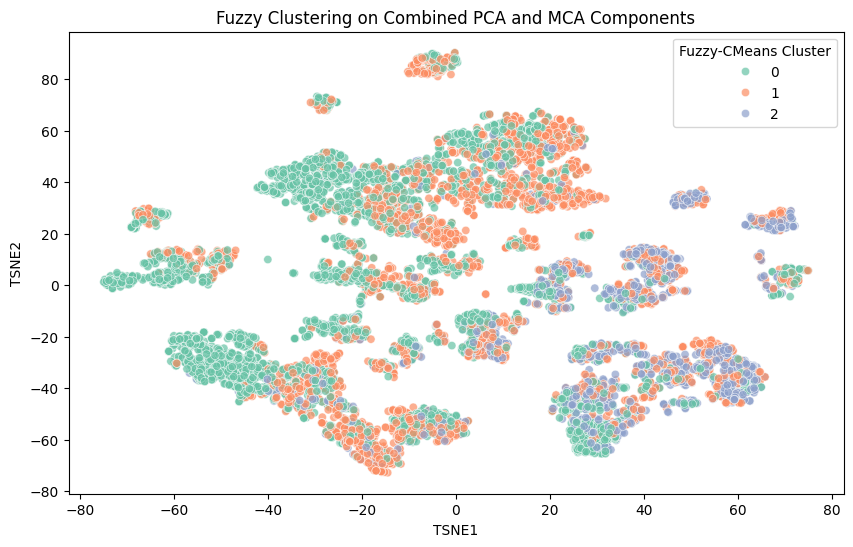

In [27]:
plot_results_on_tsne(X_tsne_lle, best_kmeans, best_gmm, dbscan_labels_lle, hdbscan_labels_lle, best_spec, best_fuzzy)

# EigenMap Data

In [28]:
kmeans_results_eigen, best_i, best_silhouette, best_kmeans = find_kmeans(X_combined_eigen)
print(f"{best_i} has the best K-Means Silhouette Score: {best_silhouette:.2f}")

gmm_results_eigen, best_i, best_silhouette, best_gmm = find_gmm(X_combined_eigen)
print(f"{best_i} has the best GMM Silhouette Score: {best_silhouette:.2f}")

dbscan_labels_eigen, dbscan_silhouette_eigen = find_dbscan(X_combined_eigen)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette_eigen:.2f}")

hdbscan_labels_eigen, hdbscan_silhouette_eigen = find_hdbscan(X_combined_eigen)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette_eigen:.2f}")

spec_results_eigen, best_i, best_silhouette, best_spec = find_spec(X_combined_eigen)
print(f"{best_i} has the best Spectral Silhouette Score: {best_silhouette:.2f}")

fuzzy_results_eigen, best_i, best_silhouette, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {best_silhouette:.2f}")

10 has the best K-Means Silhouette Score: 0.32
2 has the best GMM Silhouette Score: 0.26
DBSCAN Silhouette Score: 0.24
HDBSCAN Silhouette Score: -0.19
3 has the best Spectral Silhouette Score: 0.39
3 has the best CMeans Score: 0.16


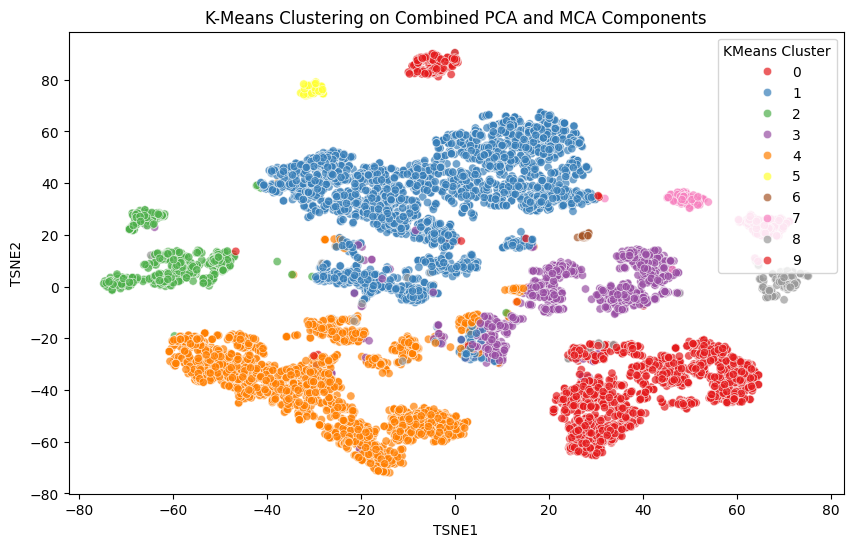

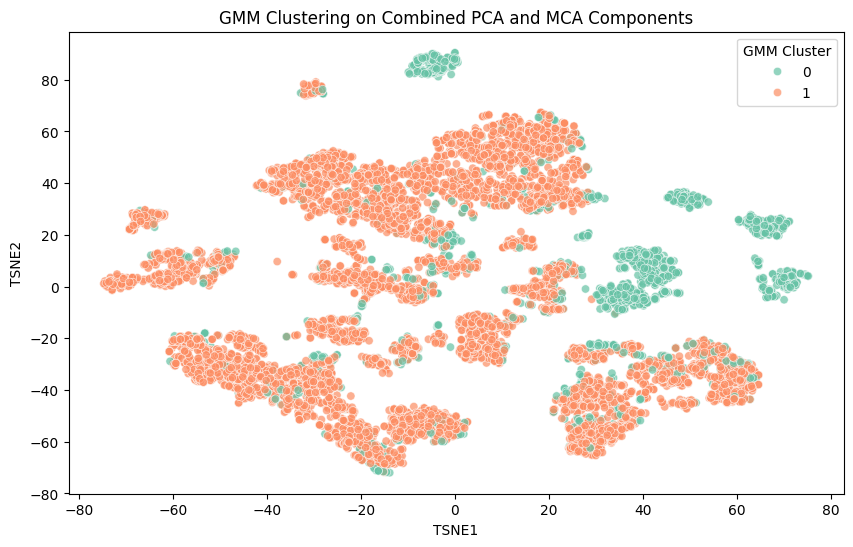

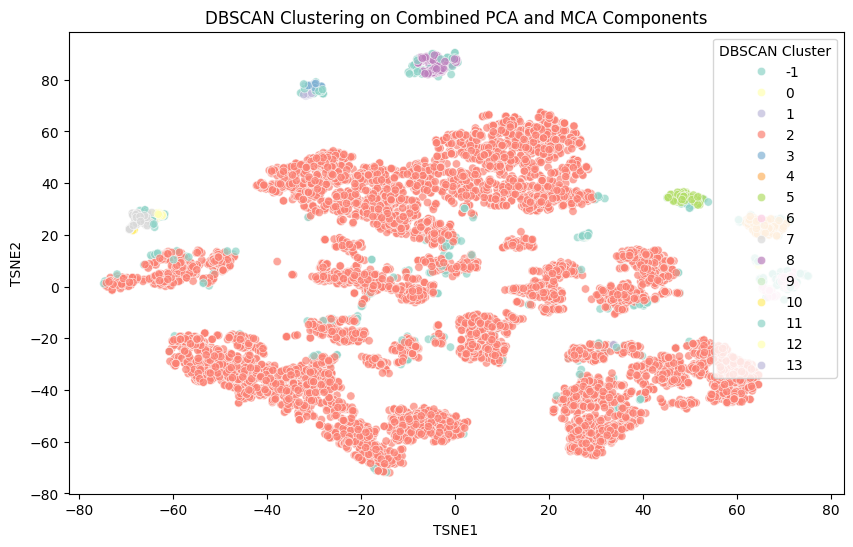

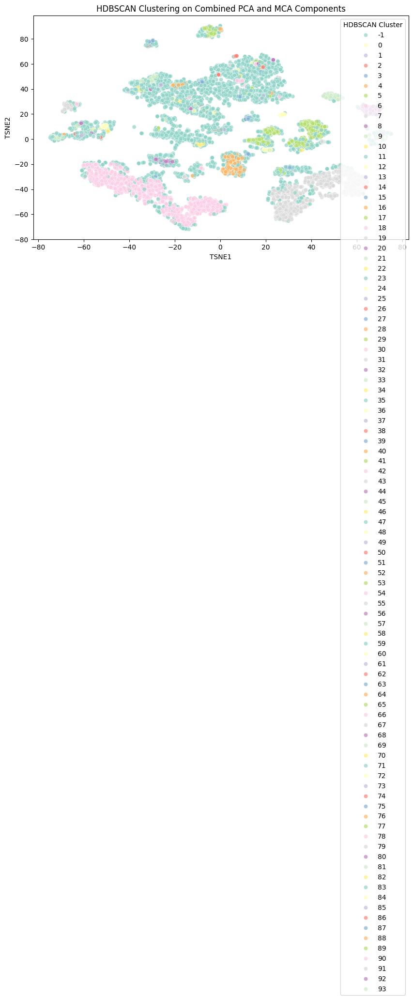

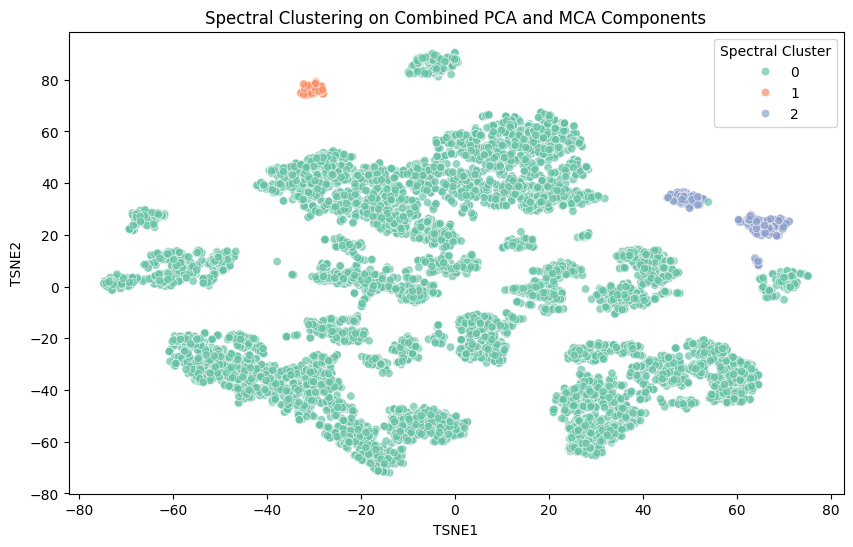

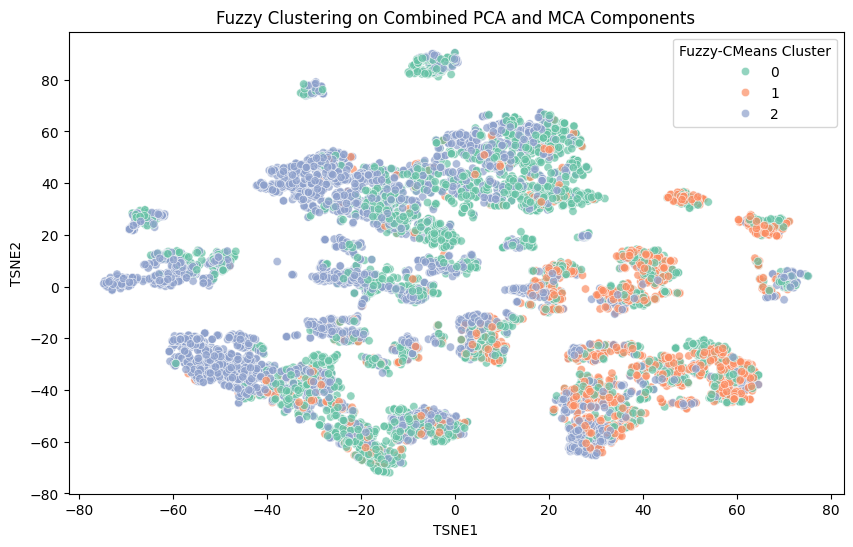

In [29]:
plot_results_on_tsne(X_tsne_eigen, best_kmeans, best_gmm, dbscan_labels_eigen, hdbscan_labels_eigen, best_spec, best_fuzzy)

# Normalized Data

In [30]:
kmeans_results, best_i, best_silhouette, best_kmeans = find_kmeans(X_combined)
print(f"{best_i} has the best K-Means Silhouette Score: {best_silhouette:.2f}")

gmm_results, best_i, best_silhouette, best_gmm = find_gmm(X_combined)
print(f"{best_i} has the best GMM Silhouette Score: {best_silhouette:.2f}")

dbscan_labels, dbscan_silhouette = find_dbscan(X_combined)
print(f"DBSCAN Silhouette Score: {dbscan_silhouette:.2f}")

hdbscan_labels, hdbscan_silhouette = find_hdbscan(X_combined)
print(f"HDBSCAN Silhouette Score: {hdbscan_silhouette:.2f}")

spec_results, best_i, best_silhouette, best_spec = find_spec(X_combined)
print(f"{best_i} has the best Spectral Silhouette Score: {best_silhouette:.2f}")

fuzzy_results, best_i, best_silhouette, best_fuzzy = find_fuzzy(X_combined_pca)
print(f"{best_i} has the best CMeans Score: {best_silhouette:.2f}")

3 has the best K-Means Silhouette Score: 0.52
2 has the best GMM Silhouette Score: 0.27
DBSCAN Silhouette Score: -0.50
HDBSCAN Silhouette Score: 0.77
2 has the best Spectral Silhouette Score: 0.77
3 has the best CMeans Score: 0.16


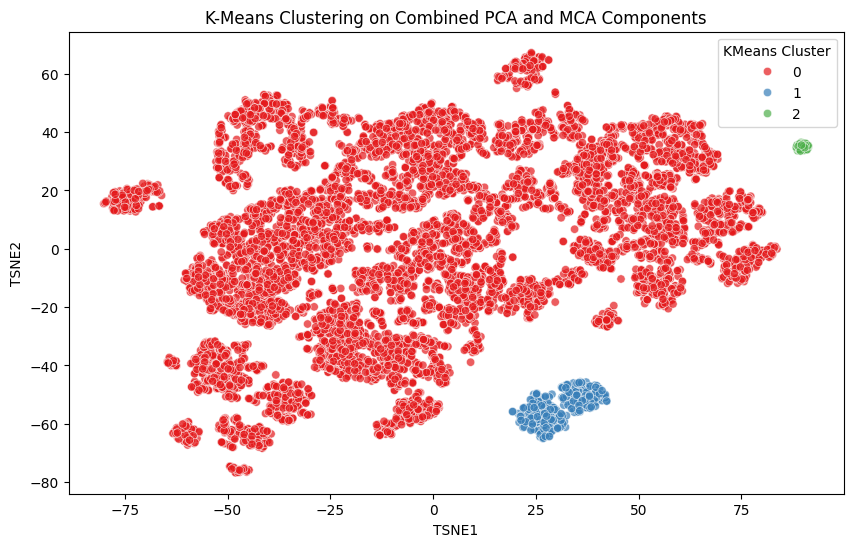

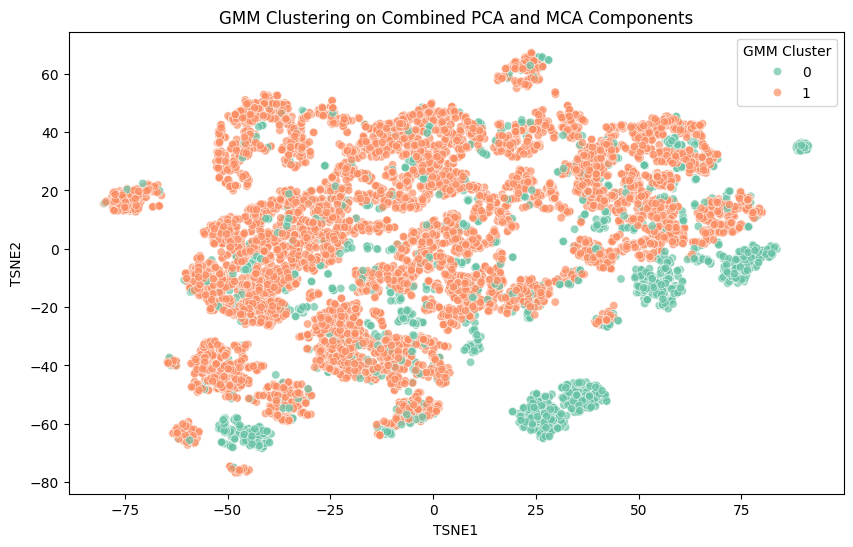

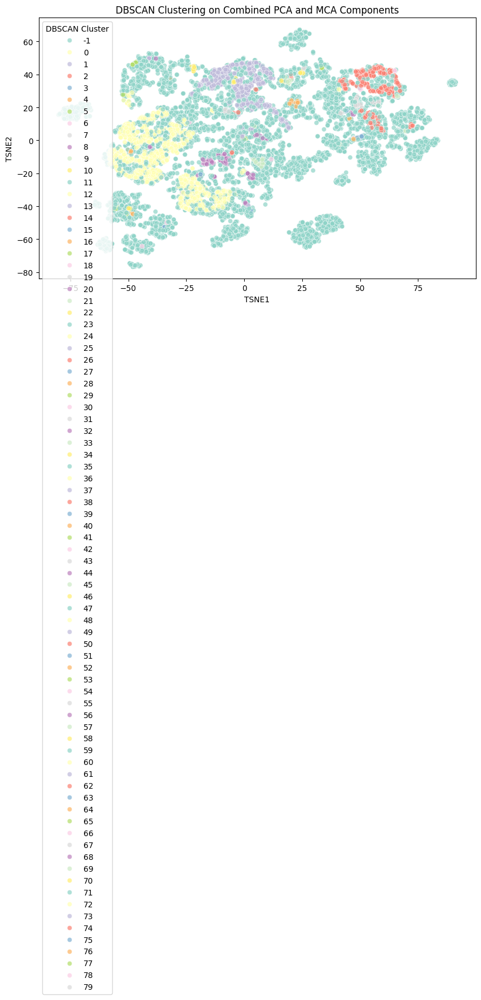

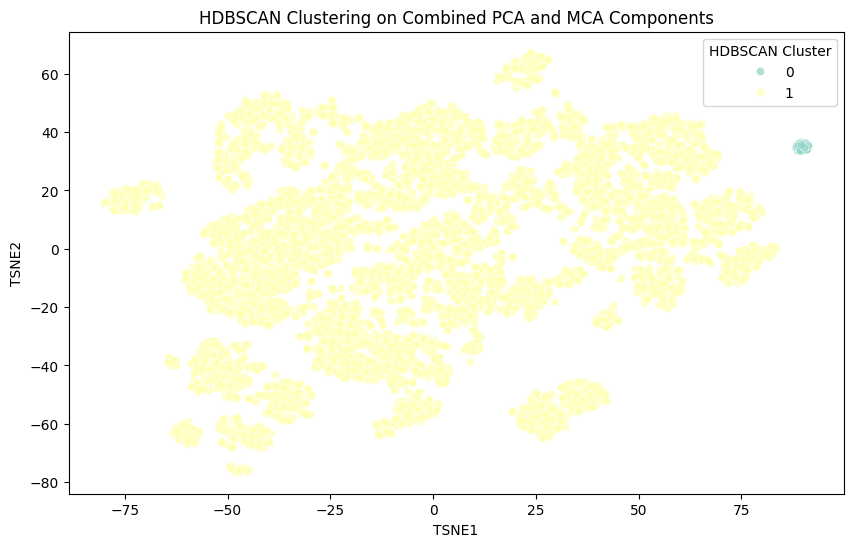

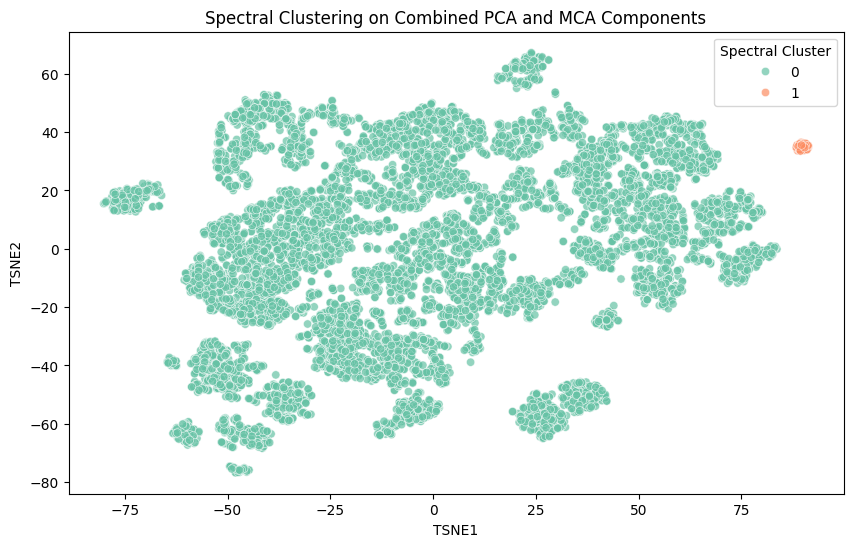

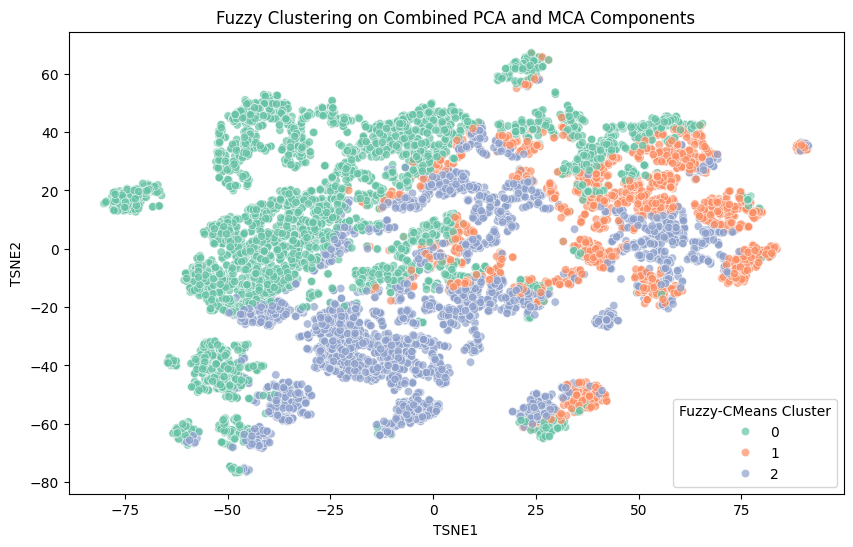

In [31]:
plot_results_on_tsne(X_tsne_normalized, best_kmeans, best_gmm, dbscan_labels, hdbscan_labels, best_spec, best_fuzzy)

# Plots

## KMeans Losses Elbow

In [32]:
def plot_kmeans_losses(results, norm):
    sorted_keys = sorted(results.keys())
    losses = [results[k]["loss"] for k in sorted_keys]

    plt.plot(range(2, len(losses)+2), losses, marker='o')
    plt.title(f'KMeans Losses - {norm}')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Loss / Inertia')
    plt.grid(True)
    plt.show()

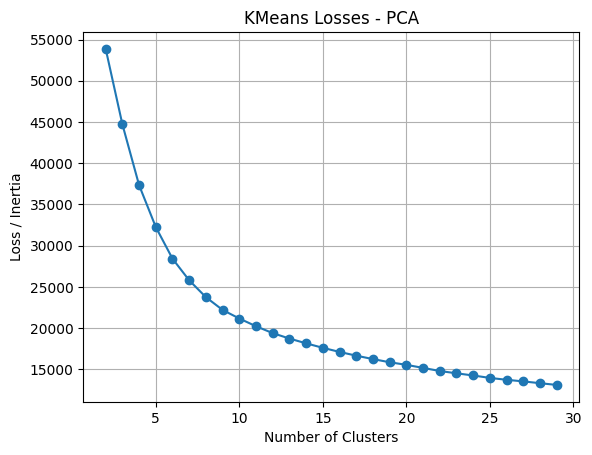

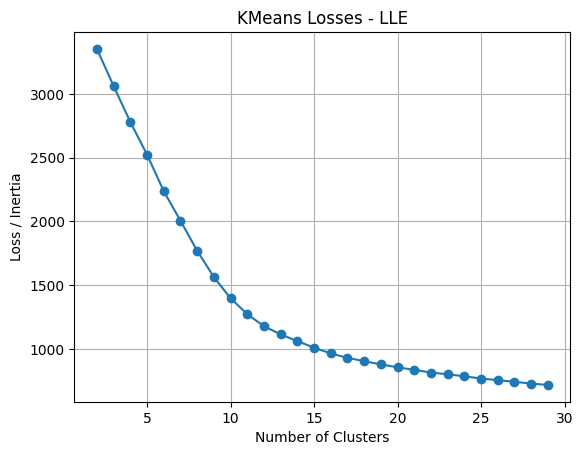

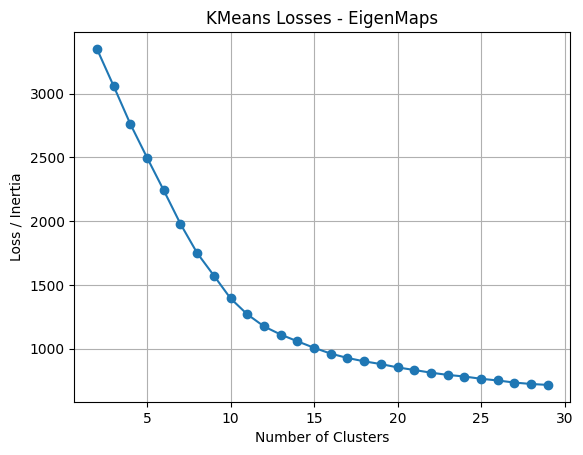

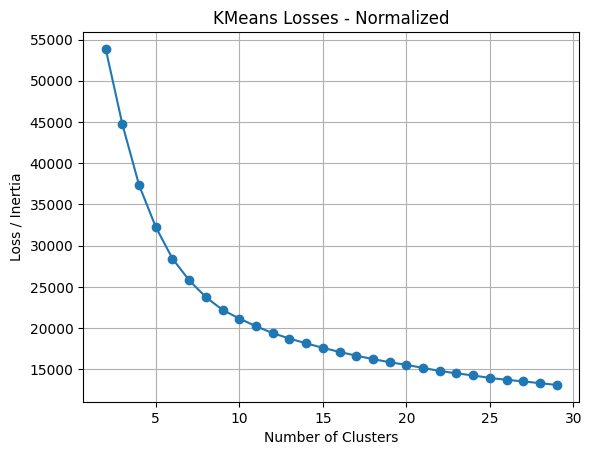

In [33]:
plot_kmeans_losses(kmeans_results_pca, "PCA")
plot_kmeans_losses(kmeans_results_lle, "LLE")
plot_kmeans_losses(kmeans_results_eigen, "EigenMaps")
plot_kmeans_losses(kmeans_results, "Normalized")


## Sillhouette per Number of Clusters

In [34]:
def plot_silhouette(results, title):
    sorted_keys = sorted(kmeans_results_pca.keys())
    sil_scores = [results[k]["score"] for k in sorted_keys]
    plt.plot(range(2, len(sil_scores)+2), sil_scores, marker='o')
    plt.title(f'Silhouette Scores - {title}')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

### PCA

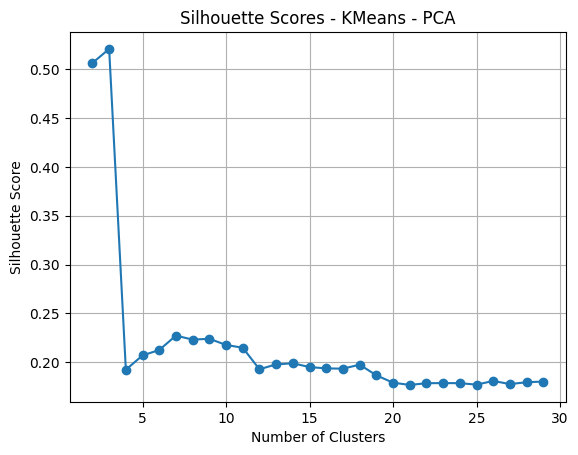

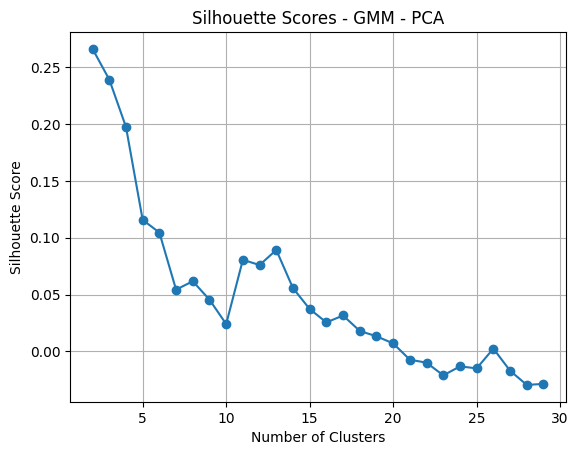

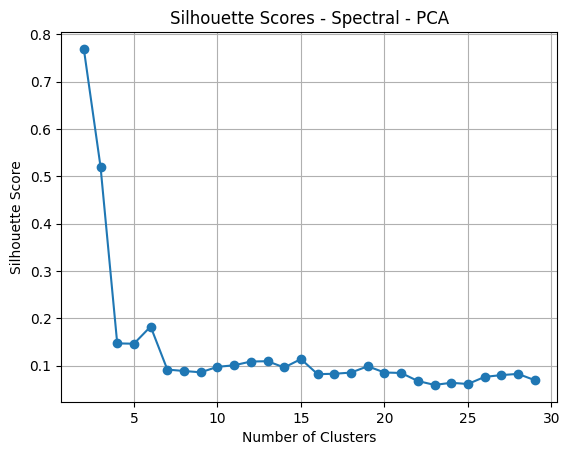

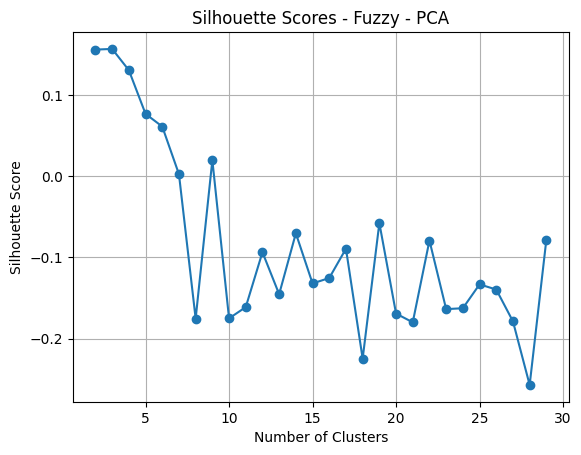

In [35]:
plot_silhouette(kmeans_results_pca, "KMeans - PCA")
plot_silhouette(gmm_results_pca, "GMM - PCA")
plot_silhouette(spec_results_pca, "Spectral - PCA")
plot_silhouette(fuzzy_results_pca, "Fuzzy - PCA")

### LLE

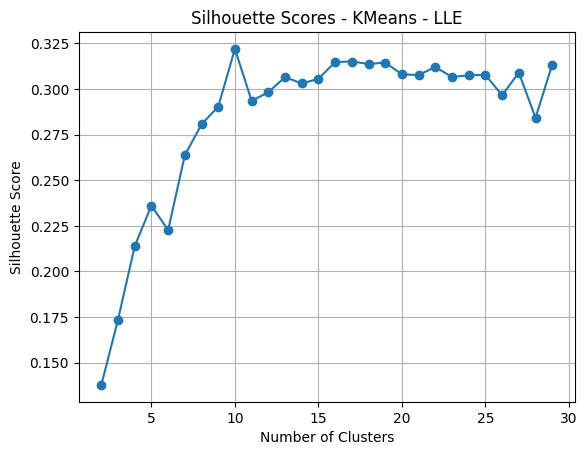

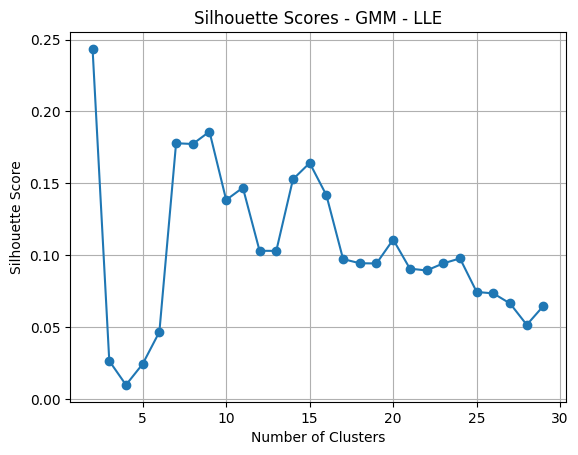

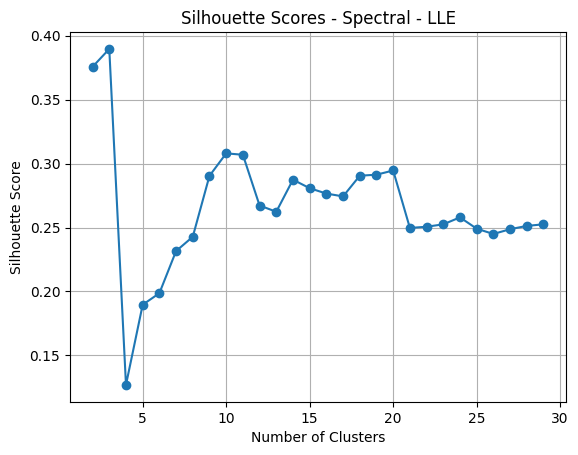

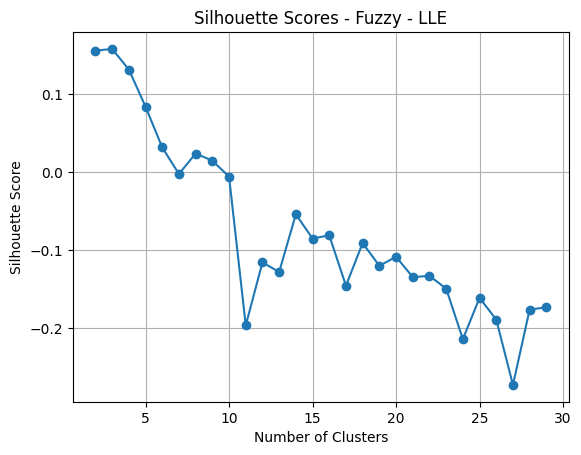

In [36]:
plot_silhouette(kmeans_results_lle, "KMeans - LLE")
plot_silhouette(gmm_results_lle, "GMM - LLE")
plot_silhouette(spec_results_lle, "Spectral - LLE")
plot_silhouette(fuzzy_results_lle, "Fuzzy - LLE")

### EigenMaps

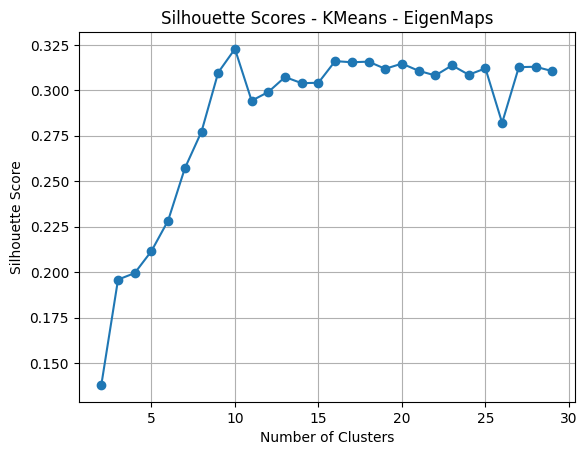

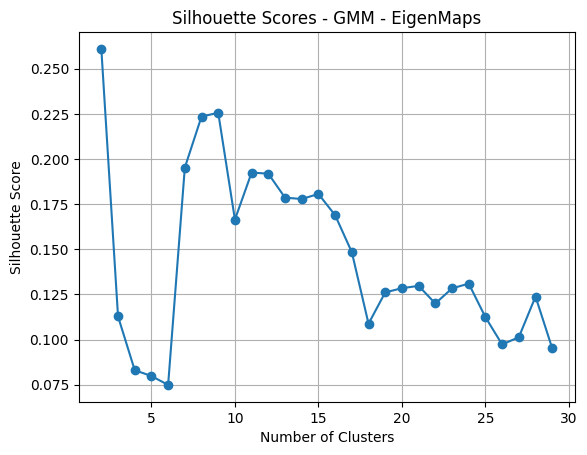

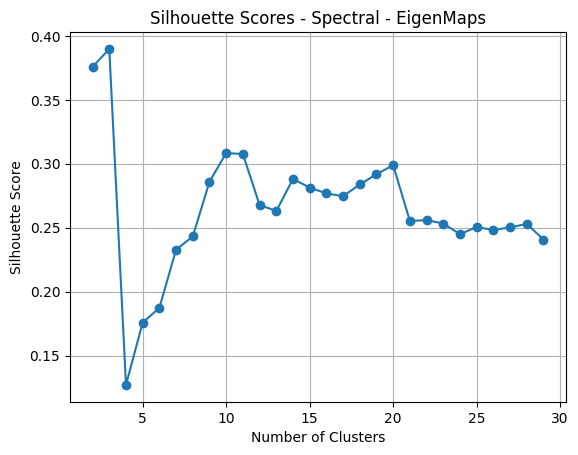

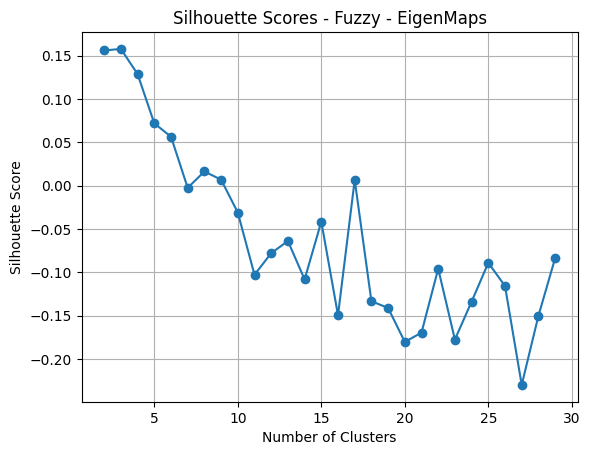

In [37]:
plot_silhouette(kmeans_results_eigen, "KMeans - EigenMaps")
plot_silhouette(gmm_results_eigen, "GMM - EigenMaps")
plot_silhouette(spec_results_eigen, "Spectral - EigenMaps")
plot_silhouette(fuzzy_results_eigen, "Fuzzy - EigenMaps")

### Normalized

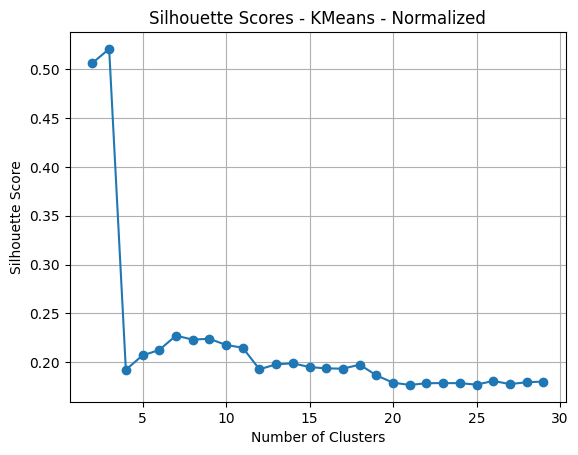

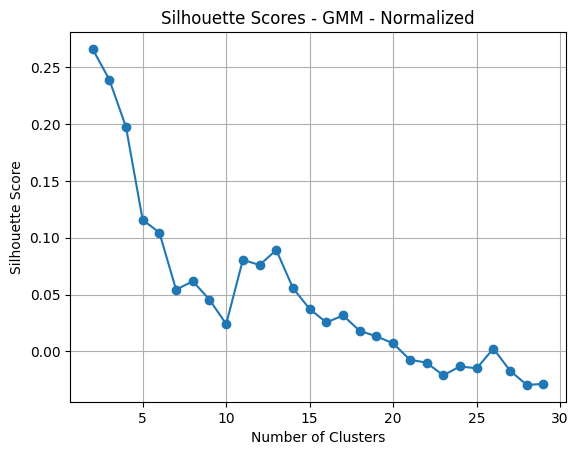

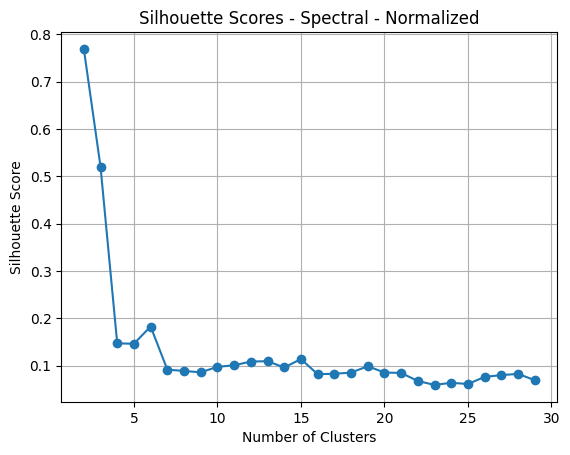

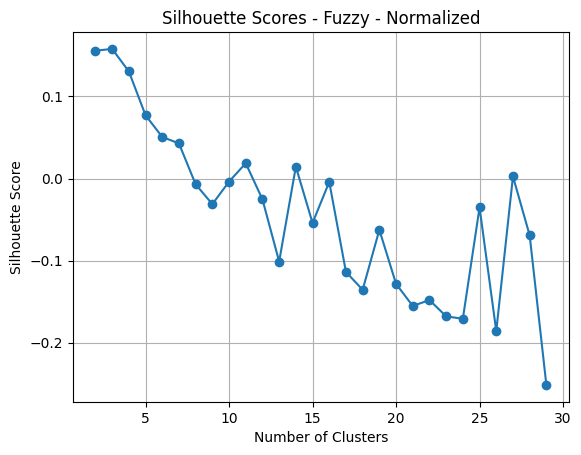

In [38]:
plot_silhouette(kmeans_results, "KMeans - Normalized")
plot_silhouette(gmm_results, "GMM - Normalized")
plot_silhouette(spec_results, "Spectral - Normalized")
plot_silhouette(fuzzy_results, "Fuzzy - Normalized")